This is a *markdown* cell. Can be used for writing a text, notes, information etc. Special Markdown syntax is used to format text. Cheat sheet with syntax can be found [here](https://www.markdownguide.org/cheat-sheet/)

# Baasic data manipulation with Geopandas

Import of libraries

In [1]:
import geopandas as gpd #base library
import pandas as pd

In [2]:
pd.set_option('display.max_rows',10)

Geospatial data refers to information that has a geographic aspect to it. This means that the records in this type of data are associated with locations on the Earth's surface. Geospatial data have many formats (KLM, GeoJSON, SHP, Geopackage...) and can come from many resources or data stores (OGC services, PostgreSQL database, API services).

**Geopandas** is a Python library origin from well build library Pandas that facilitates work with geodata. Geopandas is used by many research and data scientists due to the native approach similar to working with Excel sheets. For production and performance purposes we recommend to look for array project and spatial derived libraries.    

## Reading geospatial data

**Geopandas** can work with many different GIS formats due to the Fiona and GDAL libraries working in under the hood. The method for reading geofiles is `read_file` that tomatically detects the filetype and creates a GeoDataFrame. 


In [3]:
mli_gadm = gpd.read_file("data/gadm41_MLI_1.json")

The core data structure in GeoPandas is the `geopandas.GeoDataFrame`. GeoDataFrame is a combination of `pandas.Series`, with traditional data (numerical, boolean, text etc.), and geopandas.GeoSeries, with geometries (points, polygons etc.). Structure of geodata frame is on the picture bellow.
![](imgs/dataframe.svg)

In [4]:
mli_gadm.head(5) #display first 10 rows. Similarly can be used method `tail` for last collums

,GID_1,GID_0,COUNTRY,NAME_1,VARNAME_1,NL_NAME_1,TYPE_1,ENGTYPE_1,CC_1,HASC_1,ISO_1,geometry
0,MLI.1_1,MLI,Mali,Bamako,NA,NA,District,District,NA,ML.BA,ML-BKO,"MULTIPOLYGON (((-8.00890 12.57580, -8.01760 12..."
1,MLI.2_1,MLI,Mali,Gao,NA,NA,Région,Region,NA,ML.GA,ML-7,"MULTIPOLYGON (((1.31340 15.26060, 1.28580 15.2..."
2,MLI.3_1,MLI,Mali,Kayes,NA,NA,Région,Region,NA,ML.KY,ML-1,"MULTIPOLYGON (((-10.10730 12.17620, -10.13140 ..."
3,MLI.4_1,MLI,Mali,Kidal,NA,NA,Région,Region,NA,ML.KD,ML-8,"MULTIPOLYGON (((1.12290 17.74140, 1.11680 17.7..."
4,MLI.5_1,MLI,Mali,Koulikoro,NA,NA,Région,Region,NA,ML.KK,ML-2,"MULTIPOLYGON (((-8.58560 11.44700, -8.59600 11..."


## Geometry column

A GeoDataFrame contains a tabular, geospatial dataset and its index for each row. 

The `geometry` column holds the geometry information (or features in GeoJSON). `geometry` a GeoSeries and it has some extra methods for working with spatial data (area, distance, buffer, intersection, ...). Geometry can be 'Point', 'LineStrin', 'Polygon', MultiPolygon (feature of Shapely)

In [5]:
mli_gadm.geometry

0    MULTIPOLYGON (((-8.00890 12.57580, -8.01760 12...
1    MULTIPOLYGON (((1.31340 15.26060, 1.28580 15.2...
2    MULTIPOLYGON (((-10.10730 12.17620, -10.13140 ...
3    MULTIPOLYGON (((1.12290 17.74140, 1.11680 17.7...
4    MULTIPOLYGON (((-8.58560 11.44700, -8.59600 11...
5    MULTIPOLYGON (((-3.48560 13.16240, -3.53220 13...
6    MULTIPOLYGON (((-4.99870 12.63010, -5.03110 12...
7    MULTIPOLYGON (((-6.96410 10.35170, -6.97770 10...
8    MULTIPOLYGON (((-2.56180 15.34670, -2.57020 15...
Name: geometry, dtype: geometry

In [6]:
type(mli_gadm.geometry)

geopandas.geoseries.GeoSeries

In [7]:
mli_gadm.geometry.area

C:\Users\micha\AppData\Local\Temp\ipykernel_35208\412543457.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  mli_gadm.geometry.area


0     0.020298
1    14.911146
2    10.187790
3    12.493839
4     7.589545
5     6.832294
6     5.143373
7     5.913643
8    43.467905
dtype: float64

In [8]:
mli_gadm.geometry.boundary

0    MULTILINESTRING ((-8.00890 12.57580, -8.01760 ...
1    MULTILINESTRING ((1.31340 15.26060, 1.28580 15...
2    MULTILINESTRING ((-10.10730 12.17620, -10.1314...
3    MULTILINESTRING ((1.12290 17.74140, 1.11680 17...
4    MULTILINESTRING ((-8.58560 11.44700, -8.59600 ...
5    MULTILINESTRING ((-3.48560 13.16240, -3.53220 ...
6    MULTILINESTRING ((-4.99870 12.63010, -5.03110 ...
7    MULTILINESTRING ((-6.96410 10.35170, -6.97770 ...
8    MULTILINESTRING ((-2.56180 15.34670, -2.57020 ...
dtype: geometry

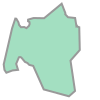

In [9]:
mli_gadm.geometry[0]

## Coordinate reference systems

The Coordinate Reference System (CRS) defines how the two-dimensional, flat coordinates in your GeoDataFrame or GeoSeries relate to places on the Earth's surface. Essentially, it's a system that helps to project the spherical surface of the Earth onto a flat surface, such as a map or a computer screen.

The .crs attribute ensures that the spatial data in your GeoDataFrame or GeoSeries is accurately aligned with geographic features. This is crucial for tasks like measuring distances, calculating areas, and overlaying spatial datasets that might be in different CRSs.

In GeoPandas, the CRS is typically stored as a Proj4 string, a WKT (Well-Known Text) string, or an EPSG (European Petroleum Survey Group) code.

For reference, a few very common projections and their EPSG codes
- WGS84 Latitude/Longitude EPSG:4326
- WGS84/Pseudo Mercator EPSG:3857
- UTM Zones (North) EPSG:32633
- UTM Zones (South) 

Geopndas are using pyproj / proj4 libraries to deal with projectionEPSG:32733733




In [10]:
mli_gadm.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

There are several situations when is necessary to set or change CRS (projection) of our dataset:
- we want to perfor a spatial operation between two atasets with differen datasets -> convert them into the same
- distance-based operations. They are perform in the native units of CRS. Most common CRS 4326 is in degrees
- plotting in a certain crs (eg to preserve area)
We can convert a GeoDataFrame to another reference system using the to_crs function.o/3395):

In [11]:
mli_gadm.geometry.area # in degrees

C:\Users\micha\AppData\Local\Temp\ipykernel_35208\358903491.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  mli_gadm.geometry.area # in degrees


0     0.020298
1    14.911146
2    10.187790
3    12.493839
4     7.589545
5     6.832294
6     5.143373
7     5.913643
8    43.467905
dtype: float64

To get the area in meters:

In [12]:
mli_gadm_3857 = mli_gadm.to_crs(epsg=3857)

In [13]:
mli_gadm_3857.geometry.area/1e6 # in km2

0       257.757908
1    193039.893976
2    130059.049619
3    164238.200007
4     96794.950664
5     87537.828649
6     65641.219332
7     74770.532307
8    574158.613838
dtype: float64

## Wrapping up: Set non geospatial data

Often we have to work with non-spatial data i.e. data that are not in the format but have some sort of georeferencing.

As example, we use an export from ACCLED database, that is in the CSV format. It has latitude and lontitude informtion but no geometry. From metadata we know that CRS is EPSG:4326 but it is not set up

In [14]:
accled_mli = gpd.read_file("data/accled-MLI-2022-01-01-2024-01-12.csv")

In [15]:
accled_mli

,event_id_cnty,event_date,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,...,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp,geometry
0,MLI31681,12-Jan-24,2024,1,Political violence,Violence against civilians,Abduction/forced disappearance,Dozo Communal Militia (Mali),,4,...,13.8771,-5.2433,2,Whatsapp,New media,"On 12 January 2024, Dozo militiamen abducted s...",0,,1705371871,None
1,MLI31697,12-Jan-24,2024,1,Strategic developments,Strategic developments,Arrests,Military Forces of Mali (2021-),Wagner Group,1,...,14.426,-6.1063,1,Whatsapp,New media,"On 12 January 2024, FAMa and Wagner forces arr...",0,,1705371872,None
2,MLI31700,12-Jan-24,2024,1,Political violence,Violence against civilians,Attack,Dozo Communal Militia (Mali),,4,...,13.8286,-4.9953,2,Whatsapp,New media,"On 12 January 2024, Dozo militia wounded one p...",0,,1705371872,None
3,MLI31690,11-Jan-24,2024,1,Political violence,Battles,Armed clash,Islamic State (Sahel),,2,...,16.2717,-0.0447,2,Undisclosed Source,Local partner-Other,"On 11 January 2024, IS Sahel militants clashed...",7,,1705371872,None
4,MLI31701,11-Jan-24,2024,1,Political violence,Violence against civilians,Attack,Islamic State (Sahel),,2,...,16.0392,0.0695,1,Studio Tamani; Undisclosed Source,Local partner-Other,"On 11 January 2024, IS Sahel militants killed ...",1,,1705371872,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4204,MLI6037,03-Jan-22,2022,1,Political violence,Violence against civilians,Attack,Islamic State (West Africa) - Greater Sahara F...,,2,...,15.8421,-0.2999,1,Undisclosed Source; Whatsapp; Radio Guintan,Local partner-Other,"On 3 January 2022, ISWAP (Greater Sahara) mili...",2,,1641863884,None
4205,MLI6034,03-Jan-22,2022,1,Political violence,Violence against civilians,Attack,Military Forces of Mali (2021-),,1,...,14.6432,-6.6909,1,RFI,International,"On 3 January 2022, the Malian army killed at l...",2,,1641863887,None
4206,MLI6038,03-Jan-22,2022,1,Political violence,Violence against civilians,Abduction/forced disappearance,JNIM: Group for Support of Islam and Muslims,,2,...,13.9555,-4.5688,1,Twitter,New media,"On 3 January 2022, JNIM militants abducted 12 ...",0,,1641863888,None
4207,MLI6036,03-Jan-22,2022,1,Political violence,Battles,Armed clash,JNIM: Group for Support of Islam and Muslims,,2,...,14.0615,-3.7861,2,Twitter; RFI,New media-International,"On 3 January 2022, JNIM militants detonated an...",10,,1648493877,None


In [16]:
accled_mli.crs

In [17]:
accled_mli.geometry

0       None
1       None
2       None
3       None
4       None
        ... 
4204    None
4205    None
4206    None
4207    None
4208    None
Name: geometry, Length: 4209, dtype: geometry

**Setting the CRS**

In [18]:
accled_mli = accled_mli.set_crs("EPSG:4326") 

In [19]:
accled_mli.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

**Converting lat lon into point geometry**

1) method - using pandas `apply` method that applies a function along an axis of the DataFrame. Cell values are passed into the applied function as its arguments. I the case of the multiargument function, arguments, that remain constant, can be specified by keywords. More clearly here: [examples](https://www.digitalocean.com/community/tutorials/pandas-dataframe-apply-examples)

In [20]:
from shapely.geometry import Point

In [21]:
accled_mli['Coordinates'] = list(zip(accled_mli.longitude, accled_mli.latitude)) 

In [22]:
accled_mli.geometry = accled_mli['Coordinates'].apply(Point) 

2) usage of GeoDataFrame constructor and points_from_xy method. This is good if we working with Excel data becouse Geopandas has not driver for Excel

In [23]:
accled_pd = pd.read_excel("data/accled-MLI-2022-01-01-2024-01-12.xlsx")

In [24]:
accled_mli_excel = gpd.GeoDataFrame(accled_pd, geometry=gpd.points_from_xy(accled_pd.longitude, accled_pd.latitude), crs="EPSG:4326")

In [25]:
accled_mli_excel

,event_id_cnty,event_date,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,...,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp,geometry
0,MLI31681,2024-01-12,2024,1,Political violence,Violence against civilians,Abduction/forced disappearance,Dozo Communal Militia (Mali),NaN,4,...,13.8771,-5.2433,2,Whatsapp,New media,"On 12 January 2024, Dozo militiamen abducted s...",0,NaN,1705371871,POINT (-5.24330 13.87710)
1,MLI31697,2024-01-12,2024,1,Strategic developments,Strategic developments,Arrests,Military Forces of Mali (2021-),Wagner Group,1,...,14.4260,-6.1063,1,Whatsapp,New media,"On 12 January 2024, FAMa and Wagner forces arr...",0,NaN,1705371872,POINT (-6.10630 14.42600)
2,MLI31700,2024-01-12,2024,1,Political violence,Violence against civilians,Attack,Dozo Communal Militia (Mali),NaN,4,...,13.8286,-4.9953,2,Whatsapp,New media,"On 12 January 2024, Dozo militia wounded one p...",0,NaN,1705371872,POINT (-4.99530 13.82860)
3,MLI31690,2024-01-11,2024,1,Political violence,Battles,Armed clash,Islamic State (Sahel),NaN,2,...,16.2717,-0.0447,2,Undisclosed Source,Local partner-Other,"On 11 January 2024, IS Sahel militants clashed...",7,NaN,1705371872,POINT (-0.04470 16.27170)
4,MLI31701,2024-01-11,2024,1,Political violence,Violence against civilians,Attack,Islamic State (Sahel),NaN,2,...,16.0392,0.0695,1,Studio Tamani; Undisclosed Source,Local partner-Other,"On 11 January 2024, IS Sahel militants killed ...",1,NaN,1705371872,POINT (0.06950 16.03920)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4204,MLI6037,2022-01-03,2022,1,Political violence,Violence against civilians,Attack,Islamic State (West Africa) - Greater Sahara F...,NaN,2,...,15.8421,-0.2999,1,Undisclosed Source; Whatsapp; Radio Guintan,Local partner-Other,"On 3 January 2022, ISWAP (Greater Sahara) mili...",2,NaN,1641863884,POINT (-0.29990 15.84210)
4205,MLI6034,2022-01-03,2022,1,Political violence,Violence against civilians,Attack,Military Forces of Mali (2021-),NaN,1,...,14.6432,-6.6909,1,RFI,International,"On 3 January 2022, the Malian army killed at l...",2,NaN,1641863887,POINT (-6.69090 14.64320)
4206,MLI6038,2022-01-03,2022,1,Political violence,Violence against civilians,Abduction/forced disappearance,JNIM: Group for Support of Islam and Muslims,NaN,2,...,13.9555,-4.5688,1,Twitter,New media,"On 3 January 2022, JNIM militants abducted 12 ...",0,NaN,1641863888,POINT (-4.56880 13.95550)
4207,MLI6036,2022-01-03,2022,1,Political violence,Battles,Armed clash,JNIM: Group for Support of Islam and Muslims,NaN,2,...,14.0615,-3.7861,2,Twitter; RFI,New media-International,"On 3 January 2022, JNIM militants detonated an...",10,NaN,1648493877,POINT (-3.78610 14.06150)


In [26]:
accled_mli_excel.geometry

0       POINT (-5.24330 13.87710)
1       POINT (-6.10630 14.42600)
2       POINT (-4.99530 13.82860)
3       POINT (-0.04470 16.27170)
4        POINT (0.06950 16.03920)
                  ...            
4204    POINT (-0.29990 15.84210)
4205    POINT (-6.69090 14.64320)
4206    POINT (-4.56880 13.95550)
4207    POINT (-3.78610 14.06150)
4208    POINT (-3.95500 14.08000)
Name: geometry, Length: 4209, dtype: geometry

In [27]:
accled_mli_excel.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## GeoInterface

*for futher development and integration*
Geopandas implemetns method __geo_interface__. The __geo_interface__ is a Python protocol that provides a standard way to interact with geographic data, enabling interoperability between different geospatial libraries. By supporting this protocol, data structures can represent themselves as GeoJSON-like dictionaries, making it easier to share geographic data across different libraries and tools without needing to convert the data into specific formats for each tool.

Interface was implemented by many other libraries like ArcPy, descartes, geojson, PySAL, Fiona, Shapely...[6]

In [28]:
accled_mli_excel.__geo_interface__['features'][0]

{'id': '0',
 'type': 'Feature',
 'properties': {'event_id_cnty': 'MLI31681',
  'event_date': Timestamp('2024-01-12 00:00:00'),
  'year': 2024,
  'time_precision': 1,
  'disorder_type': 'Political violence',
  'event_type': 'Violence against civilians',
  'sub_event_type': 'Abduction/forced disappearance',
  'actor1': 'Dozo Communal Militia (Mali)',
  'assoc_actor_1': None,
  'inter1': 4,
  'actor2': 'Civilians (Mali)',
  'assoc_actor_2': None,
  'inter2': 7,
  'interaction': 47,
  'civilian_targeting': 'Civilian targeting',
  'iso': 466,
  'region': 'Western Africa',
  'country': 'Mali',
  'admin1': 'Segou',
  'admin2': 'Macina',
  'admin3': 'Souleye',
  'location': 'Souleye',
  'latitude': 13.8771,
  'longitude': -5.2433,
  'geo_precision': 2,
  'source': 'Whatsapp',
  'source_scale': 'New media',
  'notes': 'On 12 January 2024, Dozo militiamen abducted several persons and seized livestock near Souleye (Macina, Segou).',
  'fatalities': 0,
  'tags': None,
  'timestamp': 1705371871},
 

In [29]:
accled_mli.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4209 entries, 0 to 4208
Data columns (total 33 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   event_id_cnty       4209 non-null   object  
 1   event_date          4209 non-null   object  
 2   year                4209 non-null   object  
 3   time_precision      4209 non-null   object  
 4   disorder_type       4209 non-null   object  
 5   event_type          4209 non-null   object  
 6   sub_event_type      4209 non-null   object  
 7   actor1              4209 non-null   object  
 8   assoc_actor_1       4209 non-null   object  
 9   inter1              4209 non-null   object  
 10  actor2              4209 non-null   object  
 11  assoc_actor_2       4209 non-null   object  
 12  inter2              4209 non-null   object  
 13  interaction         4209 non-null   object  
 14  civilian_targeting  4209 non-null   object  
 15  iso                 4209 non-n

## Basic opration

### Inspecting data

Get list of columns names

In [30]:
accled_mli.columns

Index(['event_id_cnty', 'event_date', 'year', 'time_precision',
       'disorder_type', 'event_type', 'sub_event_type', 'actor1',
       'assoc_actor_1', 'inter1', 'actor2', 'assoc_actor_2', 'inter2',
       'interaction', 'civilian_targeting', 'iso', 'region', 'country',
       'admin1', 'admin2', 'admin3', 'location', 'latitude', 'longitude',
       'geo_precision', 'source', 'source_scale', 'notes', 'fatalities',
       'tags', 'timestamp', 'geometry', 'Coordinates'],
      dtype='object')

Get the info about the Dataframe. Method `info` provides overall information about DataFrame. It provides information about the data type of each column. Total number of records and number of non-null records for each column. This is important because it gives some information bout the missing values that have to be for some sort of operation patched otherwise they cause an error 

In [31]:
accled_mli.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4209 entries, 0 to 4208
Data columns (total 33 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   event_id_cnty       4209 non-null   object  
 1   event_date          4209 non-null   object  
 2   year                4209 non-null   object  
 3   time_precision      4209 non-null   object  
 4   disorder_type       4209 non-null   object  
 5   event_type          4209 non-null   object  
 6   sub_event_type      4209 non-null   object  
 7   actor1              4209 non-null   object  
 8   assoc_actor_1       4209 non-null   object  
 9   inter1              4209 non-null   object  
 10  actor2              4209 non-null   object  
 11  assoc_actor_2       4209 non-null   object  
 12  inter2              4209 non-null   object  
 13  interaction         4209 non-null   object  
 14  civilian_targeting  4209 non-null   object  
 15  iso                 4209 non-n

In [32]:
accled_mli.shape # provides a dimension of the data frame in order of rows, columns

(4209, 33)

Visual inspection can be done by two methods:

- `plot` that will create  graph representation of the data
- `explore` that will show the data on the map

<Axes: >

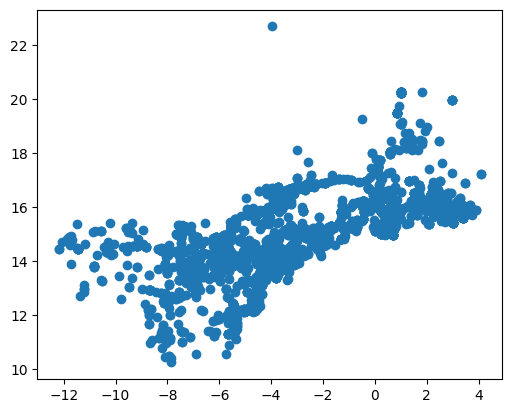

In [33]:
accled_mli.plot()

In [34]:
accled_mli.explore()

### Selection data

**Single column**

Selection a single column. This can be done by calling a corresponding attribute name or using a bracket notion. Accessing a single column will return a GeoSerie object

In [35]:
accled_mli.event_type

0       Violence against civilians
1           Strategic developments
2       Violence against civilians
3                          Battles
4       Violence against civilians
                   ...            
4204    Violence against civilians
4205    Violence against civilians
4206    Violence against civilians
4207                       Battles
4208    Explosions/Remote violence
Name: event_type, Length: 4209, dtype: object

In [36]:
accled_mli['event_type']

0       Violence against civilians
1           Strategic developments
2       Violence against civilians
3                          Battles
4       Violence against civilians
                   ...            
4204    Violence against civilians
4205    Violence against civilians
4206    Violence against civilians
4207                       Battles
4208    Explosions/Remote violence
Name: event_type, Length: 4209, dtype: object

In [37]:
type(accled_mli.event_type)

pandas.core.series.Series

**Multiple columns**

The bracket notation is used to access multiple columns. Notation with a double bracket looks odd but the first bracket is only an indexing bracket and the second is a list of columns names. Selection of multiple columns returns DataFrame  

In [38]:
accled_mli[["event_type","event_date"]]

,event_type,event_date
0,Violence against civilians,12-Jan-24
1,Strategic developments,12-Jan-24
2,Violence against civilians,12-Jan-24
3,Battles,11-Jan-24
4,Violence against civilians,11-Jan-24
...,...,...
4204,Violence against civilians,03-Jan-22
4205,Violence against civilians,03-Jan-22
4206,Violence against civilians,03-Jan-22
4207,Battles,03-Jan-22


In [39]:
type(accled_mli[["event_type","event_date"]])

pandas.core.frame.DataFrame

### Selection rows

Rows are selected by methods:

- loc: accessing the data through names
- iloc: accessing data through integer location

Bracket notation is used, similar to selection of multiple columns, to select multiple rows and columns and slice data. The first bracket is indexing. Inside are optionaly two other list, firs is aa list of rows and second is list of colums i.e. `Data[[rows],[columns]]`

**iloc**

In [40]:
accled_mli.iloc[1] # return second row

event_id_cnty                   MLI31697
event_date                     12-Jan-24
year                                2024
time_precision                         1
disorder_type     Strategic developments
                           ...          
fatalities                             0
tags                                    
timestamp                     1705371872
geometry          POINT (-6.1063 14.426)
Coordinates            (-6.1063, 14.426)
Name: 1, Length: 33, dtype: object

In [41]:
accled_mli.iloc[[1,2],[4,5]] # selection od second nd third row and 4th and 5th columns

,disorder_type,event_type
1,Strategic developments,Strategic developments
2,Political violence,Violence against civilians


**loc**

In [42]:
accled_mli.loc[0] # first row, same as iloc

event_id_cnty                    MLI31681
event_date                      12-Jan-24
year                                 2024
time_precision                          1
disorder_type          Political violence
                           ...           
fatalities                              0
tags                                     
timestamp                      1705371871
geometry          POINT (-5.2433 13.8771)
Coordinates            (-5.2433, 13.8771)
Name: 0, Length: 33, dtype: object

In [43]:
accled_mli.loc[[1,2],['disorder_type', 'event_type']] # same result like with iloc but with usage of column name

,disorder_type,event_type
1,Strategic developments,Strategic developments
2,Political violence,Violence against civilians


**Slicing** 

For slicing is important to pass a slice into the bracket notation instead of a classical syntax like in list slicing. Dataframe in bracket notation expecting an iterable object. 

In [44]:
accled_mli.iloc[1:5,4:7]

,disorder_type,event_type,sub_event_type
1,Strategic developments,Strategic developments,Arrests
2,Political violence,Violence against civilians,Attack
3,Political violence,Battles,Armed clash
4,Political violence,Violence against civilians,Attack


In [45]:
accled_mli.loc[1:5,"disorder_type":"sub_event_type"]

,disorder_type,event_type,sub_event_type
1,Strategic developments,Strategic developments,Arrests
2,Political violence,Violence against civilians,Attack
3,Political violence,Battles,Armed clash
4,Political violence,Violence against civilians,Attack
5,Strategic developments,Strategic developments,Looting/property destruction


### Basic statistics of colums

In [46]:
accled_mli.event_type.value_counts() # provides count of all unique value

event_type
Violence against civilians    1401
Strategic developments        1021
Battles                        951
Explosions/Remote violence     593
Protests                       162
Riots                           81
Name: count, dtype: int64

In [47]:
accled_mli.event_date.value_counts() # -> most event at 14-Jan-22 - Malians Protest againts ECOWAS Sanctions

event_date
14-Jan-22    31
18-Jun-23    29
16-Feb-23    19
06-Nov-22    18
23-Oct-23    16
             ..
09-Dec-22     1
23-Jul-23     1
01-Aug-23     1
02-Sep-23     1
02-Jan-22     1
Name: count, Length: 727, dtype: int64

### Indexes

When the data frame is created and no columns are selected as index, the index is created natively according to the order of data. 

As an index can be set in any column by the method `set_inex`. Setting an index to different columns, we can use this column for labeling the data an thus creating a different view of the data.

In [48]:
accled_mli.set_index('event_date', inplace=True) # inplace=True must to be set to make changes permanent

In [49]:
accled_mli.loc['14-Jan-22'] 

,event_id_cnty,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,...,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp,geometry,Coordinates
event_date,,,,,,,,,,,,,,,,,,,,,
14-Jan-22,MLI6058,2022,1,Demonstrations,Protests,Peaceful protest,Protesters (Mali),,6,,...,-8,1,AMAP; AP; AFP; Reuters; RFI; Essor,Subnational-National,"On 14 January 2022, near sixty thousand people...",0,"crowd size=nearly 60,000",1642439768,POINT (-8.00000 12.65000),"(-8, 12.65)"
14-Jan-22,MLI6060,2022,1,Demonstrations,Protests,Peaceful protest,Protesters (Mali),,6,,...,-0.0447,1,RFI; Sahelien,International,"On 14 January 2022, a number of people demonst...",0,crowd size=no report,1642439768,POINT (-0.04470 16.27170),"(-0.0447, 16.2717)"
14-Jan-22,MLI6061,2022,1,Demonstrations,Protests,Peaceful protest,Protesters (Mali),,6,,...,-10.8342,1,Facebook; VOA,New media-International,"On 14 January 2022, a number of people demonst...",0,crowd size=no report,1642439768,POINT (-10.83420 13.80890),"(-10.8342, 13.8089)"
14-Jan-22,MLI6065,2022,1,Demonstrations,Protests,Peaceful protest,Protesters (Mali),,6,,...,-11.4341,1,RFI; Sahelien; Essor,National-International,"On 14 January 2022, a number of people demonst...",0,crowd size=no report,1642439768,POINT (-11.43410 14.44170),"(-11.4341, 14.4417)"
14-Jan-22,MLI6067,2022,1,Demonstrations,Protests,Peaceful protest,Protesters (Mali),,6,,...,-9.5928,1,Facebook; Essor,New media-National,"On 14 January 2022, a number of people demonst...",0,crowd size=large,1642439768,POINT (-9.59280 15.22930),"(-9.5928, 15.2293)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14-Jan-22,MLI6374,2022,1,Political violence,Violence against civilians,Attack,Military Forces of Mali (2021-),Wagner Group,1,Civilians (Mali),...,-6.016,2,HRW,Other,"On 14 January 2022, Malian soldiers accompanie...",5,,1647888806,POINT (-6.01600 14.68000),"(-6.016, 14.68)"
14-Jan-22,MLI6066,2022,1,Demonstrations,Protests,Peaceful protest,Protesters (Mali),,6,,...,-9.4856,1,Facebook; Studio Tamani,New media-National,"On 14 January 2022, a number of people demonst...",0,crowd size=no report,1702343245,POINT (-9.48560 13.03460),"(-9.4856, 13.0346)"
14-Jan-22,MLI6069,2022,1,Demonstrations,Protests,Peaceful protest,Protesters (Mali),,6,,...,2.4022,1,Facebook; RFI; Studio Tamani,New media-National,"On 14 January 2022, a number of people demonst...",0,crowd size=no report,1702343245,POINT (2.40220 15.91820),"(2.4022, 15.9182)"


In [50]:
accled_mli.reset_index(inplace=True) # to reset inddex

In [51]:
accled_mli

,event_date,event_id_cnty,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,...,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp,geometry,Coordinates
0,12-Jan-24,MLI31681,2024,1,Political violence,Violence against civilians,Abduction/forced disappearance,Dozo Communal Militia (Mali),,4,...,-5.2433,2,Whatsapp,New media,"On 12 January 2024, Dozo militiamen abducted s...",0,,1705371871,POINT (-5.24330 13.87710),"(-5.2433, 13.8771)"
1,12-Jan-24,MLI31697,2024,1,Strategic developments,Strategic developments,Arrests,Military Forces of Mali (2021-),Wagner Group,1,...,-6.1063,1,Whatsapp,New media,"On 12 January 2024, FAMa and Wagner forces arr...",0,,1705371872,POINT (-6.10630 14.42600),"(-6.1063, 14.426)"
2,12-Jan-24,MLI31700,2024,1,Political violence,Violence against civilians,Attack,Dozo Communal Militia (Mali),,4,...,-4.9953,2,Whatsapp,New media,"On 12 January 2024, Dozo militia wounded one p...",0,,1705371872,POINT (-4.99530 13.82860),"(-4.9953, 13.8286)"
3,11-Jan-24,MLI31690,2024,1,Political violence,Battles,Armed clash,Islamic State (Sahel),,2,...,-0.0447,2,Undisclosed Source,Local partner-Other,"On 11 January 2024, IS Sahel militants clashed...",7,,1705371872,POINT (-0.04470 16.27170),"(-0.0447, 16.2717)"
4,11-Jan-24,MLI31701,2024,1,Political violence,Violence against civilians,Attack,Islamic State (Sahel),,2,...,0.0695,1,Studio Tamani; Undisclosed Source,Local partner-Other,"On 11 January 2024, IS Sahel militants killed ...",1,,1705371872,POINT (0.06950 16.03920),"(0.0695, 16.0392)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4204,03-Jan-22,MLI6037,2022,1,Political violence,Violence against civilians,Attack,Islamic State (West Africa) - Greater Sahara F...,,2,...,-0.2999,1,Undisclosed Source; Whatsapp; Radio Guintan,Local partner-Other,"On 3 January 2022, ISWAP (Greater Sahara) mili...",2,,1641863884,POINT (-0.29990 15.84210),"(-0.2999, 15.8421)"
4205,03-Jan-22,MLI6034,2022,1,Political violence,Violence against civilians,Attack,Military Forces of Mali (2021-),,1,...,-6.6909,1,RFI,International,"On 3 January 2022, the Malian army killed at l...",2,,1641863887,POINT (-6.69090 14.64320),"(-6.6909, 14.6432)"
4206,03-Jan-22,MLI6038,2022,1,Political violence,Violence against civilians,Abduction/forced disappearance,JNIM: Group for Support of Islam and Muslims,,2,...,-4.5688,1,Twitter,New media,"On 3 January 2022, JNIM militants abducted 12 ...",0,,1641863888,POINT (-4.56880 13.95550),"(-4.5688, 13.9555)"
4207,03-Jan-22,MLI6036,2022,1,Political violence,Battles,Armed clash,JNIM: Group for Support of Islam and Muslims,,2,...,-3.7861,2,Twitter; RFI,New media-International,"On 3 January 2022, JNIM militants detonated an...",10,,1648493877,POINT (-3.78610 14.06150),"(-3.7861, 14.0615)"


### Filtering data

Data can be filtered by values and logical operators 

In [52]:
battle_flt = accled_mli.event_type == 'Battles' # create logical filter true/false for query

In [53]:
battle_flt = (accled_mli.event_type == 'Battles') # same as above. Wrapping into the brackets has not any effect but helps visually separate `=` and `==` and can be used to create complex queries with logical operators

In [54]:
battle_flt

0       False
1       False
2       False
3        True
4       False
        ...  
4204    False
4205    False
4206    False
4207     True
4208    False
Name: event_type, Length: 4209, dtype: bool

In [55]:
accled_mli[battle_flt].explore() # application of filter and exploring events labeled as `battle` on map

combination of filter and administrative boundary `admin1` i.e. province with counting a unique values gives me a insight in which area are most incidents 

In [56]:
accled_mli.loc[battle_flt, 'admin1'].value_counts() 

admin1
Mopti         333
Segou         208
Gao           142
Tombouctou     68
Koulikoro      66
Menaka         60
Kayes          30
Sikasso        25
Kidal          19
Name: count, dtype: int64

In [57]:
accled_mli.event_date = pd.to_datetime(accled_mli.event_date) # converting event_date to datetime to usedd for filtering

C:\Users\micha\AppData\Local\Temp\ipykernel_35208\1605551115.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  accled_mli.event_date = pd.to_datetime(accled_mli.event_date) # converting event_date to datetime to usedd for filtering


In [58]:
battle_flt_dec = (accled_mli.event_type == 'Battles') & (accled_mli.event_date > '2023-12-01') # battles from december filter.

Logical operators are used in the above expression. For pandas operator are:  Logical operation & - and, | - or, ~ - not`b.  [more to read](https://stackoverflow.com/questions/21415661/logical-operators-for-boolean-indexing-in-pandas)

In [59]:
accled_mli.loc[battle_flt_dec, 'admin1'].value_counts() 

admin1
Mopti         13
Segou         13
Gao            5
Menaka         3
Tombouctou     1
Koulikoro      1
Kidal          1
Name: count, dtype: int64

Sometimes we want to filter data for specific values. The trick is used a list of values and `isin` method

In [60]:
provinces = ['Mopti','Segou']

In [61]:
flt = accled_mli['admin1'].isin(provinces)

In [62]:
accled_mli.loc[battle_flt_dec, 'admin1'][flt].value_counts() # second filter can be applied after the first

admin1
Mopti    13
Segou    13
Name: count, dtype: int64

In [63]:
accled_mli.loc[battle_flt_dec, 'admin1'][~flt].value_counts() # negation of the second filter to filter out notoricaly well known wrongoners

admin1
Gao           5
Menaka        3
Tombouctou    1
Koulikoro     1
Kidal         1
Name: count, dtype: int64

**Filtering by content**

In an example bellow we can see that the most active actor was JNIM. Is there any other active actor. Filed `actor1` is a string filed that contains more text than just the group name

In [64]:
jnin_flt = accled_mli['actor1'].str.contains('JNIM')

In [65]:
accled_mli.loc[battle_flt_dec, 'actor1'][flt][~jnin_flt].value_counts()

actor1
Military Forces of Mali (2021-)    3
Dan Na Ambassagou                  2
Name: count, dtype: int64

In [66]:
accled_mli.loc[battle_flt_dec, 'actor1'][flt][jnin_flt].value_counts()

actor1
JNIM: Group for Support of Islam and Muslims    21
Name: count, dtype: int64

The comparison above should suggest that in the most critical province of Mali (Mopti, Segou) was counted from Dec 23 about 26 major clashes, and only in three of them the government forces and allies were led as a primary actors...  ...what are Russian PMCs doing :-)

### Data update

In [67]:
mli_poi = gpd.read_file("data/mali_poi.zip")

In [68]:
mli_poi.value_counts()

CATEGORY                        NAME                         geometry                 
Automotive                      Fuel                         POINT (-8.02624 12.57677)    1
Lodging                         Hotel:Hotel Femme Dogon      POINT (-3.30401 14.46199)    1
                                Hotel:Hotel Ediougo          POINT (-3.34350 14.38299)    1
                                Hotel:Hotel Dunia            POINT (-2.40962 13.57640)    1
                                Hotel:Hotel Djoliba          POINT (-6.26474 13.44782)    1
                                                                                         ..
Government and Public Services  Aerodrome:Titao Airport      POINT (-2.08300 13.76700)    1
                                Aerodrome:Timbuktu Airport   POINT (-2.99617 16.73183)    1
                                Aerodrome:Timbedra Airport   POINT (-8.16700 16.23300)    1
                                Aerodrome:Tillabery Airport  POINT (1.46700 14.20000)

**Replce a string by another**

In [69]:
mli_poi.NAME.str.replace(':',' ') # string methods like `replace can be call on entire column

0          Level crossing
1          Level crossing
2                    Fuel
3                    Fuel
4             Fuel SOYATT
              ...        
424                  Peak
425    Peak Hombori Tondo
426         Museum Manega
427             Camp site
428        Peak Mont Lani
Name: NAME, Length: 429, dtype: object

**Renme columns name**

In [70]:
mli_poi.rename(columns={'NAME':'name','CATEGORY':'category'}, inplace=True) # rename the column names to standardise datasets columns name

**Add new column**

In [71]:
mli_poi['exist'] = True

In [72]:
mli_poi

,category,name,geometry,exist
0,Automotive,Level crossing,POINT (-12.21762 14.45761),True
1,Automotive,Level crossing,POINT (-12.17335 14.47339),True
2,Automotive,Fuel,POINT (-8.03410 12.63872),True
3,Automotive,Fuel,POINT (-8.02624 12.57677),True
4,Automotive,Fuel:SOYATT,POINT (-8.02324 12.58398),True
...,...,...,...,...
424,Tourism,Peak,POINT (-1.72595 15.24998),True
425,Tourism,Peak:Hombori Tondo,POINT (-1.66737 15.25703),True
426,Tourism,Museum:Manega,POINT (-1.50910 12.78314),True
427,Tourism,Camp site,POINT (0.72499 14.95950),True


In [73]:
mli_poi.exist.dtype # geopndas autodetect data type

dtype('bool')

In [74]:
mli_poi['exist'] = 1

In [75]:
mli_poi

,category,name,geometry,exist
0,Automotive,Level crossing,POINT (-12.21762 14.45761),1
1,Automotive,Level crossing,POINT (-12.17335 14.47339),1
2,Automotive,Fuel,POINT (-8.03410 12.63872),1
3,Automotive,Fuel,POINT (-8.02624 12.57677),1
4,Automotive,Fuel:SOYATT,POINT (-8.02324 12.58398),1
...,...,...,...,...
424,Tourism,Peak,POINT (-1.72595 15.24998),1
425,Tourism,Peak:Hombori Tondo,POINT (-1.66737 15.25703),1
426,Tourism,Museum:Manega,POINT (-1.50910 12.78314),1
427,Tourism,Camp site,POINT (0.72499 14.95950),1


In [76]:
mli_poi.exist.dtype # geopndas autodetect data type

dtype('int64')

In [77]:
mli_poi.exist.astype('int32') # use astype to change  type

0      1
1      1
2      1
3      1
4      1
      ..
424    1
425    1
426    1
427    1
428    1
Name: exist, Length: 429, dtype: int32

**Update value**

In [78]:
mli_poi.loc[2, 'exist'] = 0

In [79]:
mli_poi.at[1, 'exist'] = 0 # similar as above

In [80]:
mli_poi

,category,name,geometry,exist
0,Automotive,Level crossing,POINT (-12.21762 14.45761),1
1,Automotive,Level crossing,POINT (-12.17335 14.47339),0
2,Automotive,Fuel,POINT (-8.03410 12.63872),0
3,Automotive,Fuel,POINT (-8.02624 12.57677),1
4,Automotive,Fuel:SOYATT,POINT (-8.02324 12.58398),1
...,...,...,...,...
424,Tourism,Peak,POINT (-1.72595 15.24998),1
425,Tourism,Peak:Hombori Tondo,POINT (-1.66737 15.25703),1
426,Tourism,Museum:Manega,POINT (-1.50910 12.78314),1
427,Tourism,Camp site,POINT (0.72499 14.95950),1


**Update values by filter**

In [81]:
exist_flt = mli_poi['exist'] == 0

In [82]:
mli_poi.loc[exist_flt, 'exist'] = 1

In [83]:
mli_poi

,category,name,geometry,exist
0,Automotive,Level crossing,POINT (-12.21762 14.45761),1
1,Automotive,Level crossing,POINT (-12.17335 14.47339),1
2,Automotive,Fuel,POINT (-8.03410 12.63872),1
3,Automotive,Fuel,POINT (-8.02624 12.57677),1
4,Automotive,Fuel:SOYATT,POINT (-8.02324 12.58398),1
...,...,...,...,...
424,Tourism,Peak,POINT (-1.72595 15.24998),1
425,Tourism,Peak:Hombori Tondo,POINT (-1.66737 15.25703),1
426,Tourism,Museum:Manega,POINT (-1.50910 12.78314),1
427,Tourism,Camp site,POINT (0.72499 14.95950),1


**Update by apply**

In [84]:
def lower(value: str) -> str:
    return value.lower()
mli_poi.name.apply(lower)

0          level crossing
1          level crossing
2                    fuel
3                    fuel
4             fuel:soyatt
              ...        
424                  peak
425    peak:hombori tondo
426         museum:manega
427             camp site
428        peak:mont lani
Name: name, Length: 429, dtype: object

**Update by lambda function**

In [85]:
mli_poi.name.apply(lambda x: x.capitalize())

0          Level crossing
1          Level crossing
2                    Fuel
3                    Fuel
4             Fuel:soyatt
              ...        
424                  Peak
425    Peak:hombori tondo
426         Museum:manega
427             Camp site
428        Peak:mont lani
Name: name, Length: 429, dtype: object

**Split by delimeter**

In [86]:
mli_poi[['type', 'local_name']] = mli_poi.name.str.split(':', expand=True) # extrct a local name from data

In [87]:
mli_poi

,category,name,geometry,exist,type,local_name
0,Automotive,Level crossing,POINT (-12.21762 14.45761),1,Level crossing,None
1,Automotive,Level crossing,POINT (-12.17335 14.47339),1,Level crossing,None
2,Automotive,Fuel,POINT (-8.03410 12.63872),1,Fuel,None
3,Automotive,Fuel,POINT (-8.02624 12.57677),1,Fuel,None
4,Automotive,Fuel:SOYATT,POINT (-8.02324 12.58398),1,Fuel,SOYATT
...,...,...,...,...,...,...
424,Tourism,Peak,POINT (-1.72595 15.24998),1,Peak,None
425,Tourism,Peak:Hombori Tondo,POINT (-1.66737 15.25703),1,Peak,Hombori Tondo
426,Tourism,Museum:Manega,POINT (-1.50910 12.78314),1,Museum,Manega
427,Tourism,Camp site,POINT (0.72499 14.95950),1,Camp site,None


**Drop columns**

In [88]:
mli_poi.drop(columns='name', axis=0) # axis 0 = columns, 1 = rows 

,category,geometry,exist,type,local_name
0,Automotive,POINT (-12.21762 14.45761),1,Level crossing,None
1,Automotive,POINT (-12.17335 14.47339),1,Level crossing,None
2,Automotive,POINT (-8.03410 12.63872),1,Fuel,None
3,Automotive,POINT (-8.02624 12.57677),1,Fuel,None
4,Automotive,POINT (-8.02324 12.58398),1,Fuel,SOYATT
...,...,...,...,...,...
424,Tourism,POINT (-1.72595 15.24998),1,Peak,None
425,Tourism,POINT (-1.66737 15.25703),1,Peak,Hombori Tondo
426,Tourism,POINT (-1.50910 12.78314),1,Museum,Manega
427,Tourism,POINT (0.72499 14.95950),1,Camp site,None


In [89]:
mli_poi.dropna(subset='local_name') # droping None values from  to keep only rows with local name

,category,name,geometry,exist,type,local_name
4,Automotive,Fuel:SOYATT,POINT (-8.02324 12.58398),1,Fuel,SOYATT
13,Automotive,Fuel:TOTAL,POINT (-7.96708 12.65794),1,Fuel,TOTAL
33,Automotive,Fuel:T13,POINT (-4.18996 14.49942),1,Fuel,T13
41,Eating&Drinking,Pub:Santa Fee,POINT (-8.06519 12.75705),1,Pub,Santa Fee
42,Eating&Drinking,Restaurant:Le Crystal,POINT (-8.03174 12.63485),1,Restaurant,Le Crystal
...,...,...,...,...,...,...
389,Tourism,Currency exchange:BNDA,POINT (-3.00310 16.75745),1,Currency exchange,BNDA
416,Tourism,Spring:puits,POINT (-2.00148 13.33952),1,Spring,puits
425,Tourism,Peak:Hombori Tondo,POINT (-1.66737 15.25703),1,Peak,Hombori Tondo
426,Tourism,Museum:Manega,POINT (-1.50910 12.78314),1,Museum,Manega


In [90]:
mli_poi.dropna(axis='index', how='any') # same. drop any row where is any column have none value but let one empty because empty has all 

,category,name,geometry,exist,type,local_name
4,Automotive,Fuel:SOYATT,POINT (-8.02324 12.58398),1,Fuel,SOYATT
13,Automotive,Fuel:TOTAL,POINT (-7.96708 12.65794),1,Fuel,TOTAL
33,Automotive,Fuel:T13,POINT (-4.18996 14.49942),1,Fuel,T13
41,Eating&Drinking,Pub:Santa Fee,POINT (-8.06519 12.75705),1,Pub,Santa Fee
42,Eating&Drinking,Restaurant:Le Crystal,POINT (-8.03174 12.63485),1,Restaurant,Le Crystal
...,...,...,...,...,...,...
389,Tourism,Currency exchange:BNDA,POINT (-3.00310 16.75745),1,Currency exchange,BNDA
416,Tourism,Spring:puits,POINT (-2.00148 13.33952),1,Spring,puits
425,Tourism,Peak:Hombori Tondo,POINT (-1.66737 15.25703),1,Peak,Hombori Tondo
426,Tourism,Museum:Manega,POINT (-1.50910 12.78314),1,Museum,Manega


In [91]:
mli_poi.sort_values(by='local_name',ascending=True)

,category,name,geometry,exist,type,local_name
345,Sports,Pitch:ANGE,POINT (-7.94633 12.67195),1,Pitch,ANGE
344,Sports,Multi sport:ANGE,POINT (-7.94633 12.67195),1,Multi sport,ANGE
150,Government and Public Services,Airport terminal:Aeroport de Bobo Dioulasso,POINT (-4.31973 11.16381),1,Airport terminal,Aeroport de Bobo Dioulasso
47,Eating&Drinking,Restaurant:African Food,POINT (-7.99040 12.61922),1,Restaurant,African Food
90,Government and Public Services,Aerodrome:Aioun el Atrouss Airport,POINT (-9.63788 16.71130),1,Aerodrome,Aioun el Atrouss Airport
...,...,...,...,...,...,...
421,Tourism,Peak,POINT (-1.73693 15.26025),1,Peak,None
422,Tourism,Peak,POINT (-1.73041 15.26025),1,Peak,None
423,Tourism,Peak,POINT (-1.72886 15.25214),1,Peak,None
424,Tourism,Peak,POINT (-1.72595 15.24998),1,Peak,None


**Grouping data and statistics**

In [92]:
accled_mli.fatalities = accled_mli.fatalities.astype('int')

In [93]:
accled_mli.fatalities.max() # overall statistic do not say mony things

173

In [94]:
accled_mli.fatalities.median() # zero becouse most of the event is wihout any deads

0.0

In [95]:
accled_mli.fatalities.describe() # some better statistics

count    4209.00000
mean        2.21264
std         7.64139
min         0.00000
25%         0.00000
50%         0.00000
75%         2.00000
max       173.00000
Name: fatalities, dtype: float64

What to do if we want to know what is the most violent province in term of the casualties

In [96]:
accled_mli.rename(columns={'admin1':'province','admin2':'division', 'admin3':'municipality'}, inplace=True) # just renemle the default adminX to somting meanigfull  

In [97]:
province_grp = accled_mli.groupby(['province']) # creting a group. assigment as variable avoid retyping all the time when we wnt to work with group 

In [98]:
province_grp.get_group(('Gao',))# get data for 'Gao' similary like filter

,event_date,event_id_cnty,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,...,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp,geometry,Coordinates
3,2024-01-11,MLI31690,2024,1,Political violence,Battles,Armed clash,Islamic State (Sahel),,2,...,-0.0447,2,Undisclosed Source,Local partner-Other,"On 11 January 2024, IS Sahel militants clashed...",7,,1705371872,POINT (-0.04470 16.27170),"(-0.0447, 16.2717)"
4,2024-01-11,MLI31701,2024,1,Political violence,Violence against civilians,Attack,Islamic State (Sahel),,2,...,0.0695,1,Studio Tamani; Undisclosed Source,Local partner-Other,"On 11 January 2024, IS Sahel militants killed ...",1,,1705371872,POINT (0.06950 16.03920),"(0.0695, 16.0392)"
5,2024-01-11,MLI31718,2024,1,Strategic developments,Strategic developments,Looting/property destruction,Islamic State (Sahel),,2,...,0.0708,1,Undisclosed Source,Local partner-Other,"Looting: On 11 January 2024, IS Sahel militant...",0,,1705371872,POINT (0.07080 16.15150),"(0.0708, 16.1515)"
8,2024-01-10,MLI31683,2024,1,Political violence,Violence against civilians,Abduction/forced disappearance,Islamic State (Sahel),,2,...,0.7464,2,Undisclosed Source,Local partner-Other,"On 10 January 2024, IS Sahel militants abducte...",0,,1705371871,POINT (0.74640 15.32170),"(0.7464, 15.3217)"
15,2024-01-09,MLI31682,2024,1,Political violence,Violence against civilians,Abduction/forced disappearance,Islamic State (Sahel),,2,...,0.7464,2,Undisclosed Source,Local partner-Other,"On 9 January 2024, IS Sahel militants abducted...",0,,1705371871,POINT (0.74640 15.32170),"(0.7464, 15.3217)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4194,2022-01-05,MLI6047,2022,1,Political violence,Battles,Armed clash,Ganda Izo,,3,...,-0.0322,2,Radio Guintan; Studio Tamani; Twitter,New media-National,"On 5 January 2022, Ganda Izo and FLN militiame...",2,,1702343245,POINT (-0.03220 16.19080),"(-0.0322, 16.1908)"
4195,2022-01-04,MLI6040,2022,1,Political violence,Battles,Armed clash,JNIM: Group for Support of Islam and Muslims,,2,...,-0.41,2,Signal; Imangahdien; Whatsapp; Twitter,New media-Subnational,"On 4 January 2022, JNIM and ISWAP (Greater Sah...",9,,1641863884,POINT (-0.41000 15.81970),"(-0.41, 15.8197)"
4202,2022-01-03,MLI6033,2022,1,Political violence,Violence against civilians,Attack,Islamic State (West Africa) - Greater Sahara F...,,2,...,-0.41,1,Radio Guintan; Whatsapp; Undisclosed Source,Local partner-Other,"On 3 January 2022, ISWAP (Greater Sahara) mili...",1,,1641863884,POINT (-0.41000 15.81970),"(-0.41, 15.8197)"
4203,2022-01-03,MLI6035,2022,1,Political violence,Violence against civilians,Attack,Islamic State (West Africa) - Greater Sahara F...,,2,...,-0.4278,1,Whatsapp; Radio Guintan; Undisclosed Source,Local partner-Other,"On 3 January 2022, ISWAP (Greater Sahara) mili...",1,,1641863884,POINT (-0.42780 15.80920),"(-0.4278, 15.8092)"


In [99]:
province_grp['fatalities'].sum() # But, with group we can easily get a coresponding statistics for a province

province
Bamako           9
Gao           1887
Kayes           75
Kidal          137
Koulikoro      478
Menaka        1322
Mopti         3431
Segou         1265
Sikasso         75
Tombouctou     634
Name: fatalities, dtype: int32

In [100]:
province_grp['event_type'].value_counts()

province    event_type                
Bamako      Protests                       25
            Violence against civilians     11
            Strategic developments          8
            Riots                           5
Gao         Violence against civilians    291
                                         ... 
Tombouctou  Strategic developments        110
            Explosions/Remote violence     83
            Battles                        68
            Protests                       12
            Riots                           5
Name: count, Length: 58, dtype: int64

In [101]:
province_grp = accled_mli.groupby(['province', 'event_type'])

In [102]:
province_grp['fatalities'].sum()

province    event_type                
Bamako      Protests                        0
            Riots                           3
            Strategic developments          3
            Violence against civilians      3
Gao         Battles                       980
                                         ... 
Tombouctou  Explosions/Remote violence     67
            Protests                        0
            Riots                           1
            Strategic developments          0
            Violence against civilians    316
Name: fatalities, Length: 58, dtype: int32

### Datetime

In [103]:
accled_mli.event_date = pd.to_datetime(accled_mli.event_date)  # datetime object

In [104]:
accled_mli.event_date.iloc[0]

Timestamp('2024-01-12 00:00:00')

In [105]:
accled_mli.event_date.iloc[0].day

12

In [106]:
accled_mli.event_date.iloc[0].month

1

In [107]:
accled_mli.event_date.iloc[0].year

2024

**Useful methods**

In [108]:
accled_mli.event_date.max() - accled_mli.event_date.min() # time span

Timedelta('740 days 00:00:00')

In [109]:
time_flt = (accled_mli.event_date >= pd.to_datetime('2021-05-01')) & (accled_mli.event_date <= pd.to_datetime('2021-07-01')) # filter by period

In [110]:
accled_mli.set_index('event_date', inplace= True) # seting datetime as index to have abiliti slice data by time

In [111]:
accled_mli

,event_id_cnty,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,...,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp,geometry,Coordinates
event_date,,,,,,,,,,,,,,,,,,,,,
2024-01-12,MLI31681,2024,1,Political violence,Violence against civilians,Abduction/forced disappearance,Dozo Communal Militia (Mali),,4,Civilians (Mali),...,-5.2433,2,Whatsapp,New media,"On 12 January 2024, Dozo militiamen abducted s...",0,,1705371871,POINT (-5.24330 13.87710),"(-5.2433, 13.8771)"
2024-01-12,MLI31697,2024,1,Strategic developments,Strategic developments,Arrests,Military Forces of Mali (2021-),Wagner Group,1,Civilians (Mali),...,-6.1063,1,Whatsapp,New media,"On 12 January 2024, FAMa and Wagner forces arr...",0,,1705371872,POINT (-6.10630 14.42600),"(-6.1063, 14.426)"
2024-01-12,MLI31700,2024,1,Political violence,Violence against civilians,Attack,Dozo Communal Militia (Mali),,4,Civilians (Mali),...,-4.9953,2,Whatsapp,New media,"On 12 January 2024, Dozo militia wounded one p...",0,,1705371872,POINT (-4.99530 13.82860),"(-4.9953, 13.8286)"
2024-01-11,MLI31690,2024,1,Political violence,Battles,Armed clash,Islamic State (Sahel),,2,GATIA: Imghad Tuareg and Allies Self-Defense G...,...,-0.0447,2,Undisclosed Source,Local partner-Other,"On 11 January 2024, IS Sahel militants clashed...",7,,1705371872,POINT (-0.04470 16.27170),"(-0.0447, 16.2717)"
2024-01-11,MLI31701,2024,1,Political violence,Violence against civilians,Attack,Islamic State (Sahel),,2,Civilians (Mali),...,0.0695,1,Studio Tamani; Undisclosed Source,Local partner-Other,"On 11 January 2024, IS Sahel militants killed ...",1,,1705371872,POINT (0.06950 16.03920),"(0.0695, 16.0392)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-01-03,MLI6037,2022,1,Political violence,Violence against civilians,Attack,Islamic State (West Africa) - Greater Sahara F...,,2,Civilians (Mali),...,-0.2999,1,Undisclosed Source; Whatsapp; Radio Guintan,Local partner-Other,"On 3 January 2022, ISWAP (Greater Sahara) mili...",2,,1641863884,POINT (-0.29990 15.84210),"(-0.2999, 15.8421)"
2022-01-03,MLI6034,2022,1,Political violence,Violence against civilians,Attack,Military Forces of Mali (2021-),,1,Civilians (Mali),...,-6.6909,1,RFI,International,"On 3 January 2022, the Malian army killed at l...",2,,1641863887,POINT (-6.69090 14.64320),"(-6.6909, 14.6432)"
2022-01-03,MLI6038,2022,1,Political violence,Violence against civilians,Abduction/forced disappearance,JNIM: Group for Support of Islam and Muslims,,2,Civilians (Mali),...,-4.5688,1,Twitter,New media,"On 3 January 2022, JNIM militants abducted 12 ...",0,,1641863888,POINT (-4.56880 13.95550),"(-4.5688, 13.9555)"


In [112]:
accled_mli.sort_index(inplace=True)
accled_mli['2022-05-01':'2022-07-01'] # time slicing after the sorting a index in proper order

,event_id_cnty,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,...,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp,geometry,Coordinates
event_date,,,,,,,,,,,,,,,,,,,,,
2022-05-01,MLI6560,2022,2,Strategic developments,Strategic developments,Disrupted weapons use,Military Forces of France (2017-),Military Forces of Estonia (2021-),8,Islamic State (Sahel),...,1.297,2,Armee Francaise,International,Weapons seizure: Around 1 May 2022 (between 30...,0,,1652116565,POINT (1.29700 15.40240),"(1.297, 15.4024)"
2022-05-01,MLI6572,2022,1,Political violence,Explosions/Remote violence,Remote explosive/landmine/IED,JNIM: Group for Support of Islam and Muslims,,2,,...,-5.9352,1,Mali Actu; Facebook; Twitter,New media-National,"On 1 May 2022, JNIM militants set off explosiv...",0,,1652116564,POINT (-5.93520 14.39340),"(-5.9352, 14.3934)"
2022-05-02,MLI6556,2022,1,Strategic developments,Strategic developments,Change to group/activity,Military Forces of Mali (2021-),Wagner Group,1,,...,-2.7861,1,Undisclosed Source; Whatsapp,Local partner-Other,"Movement of forces: On 2 May 2022, overnight M...",0,,1652116564,POINT (-2.78610 15.85100),"(-2.7861, 15.851)"
2022-05-02,MLI6548,2022,1,Political violence,Violence against civilians,Attack,Dozo Communal Militia (Mali),,4,Civilians (Mali),...,-5.0169,2,Undisclosed Source; Twitter,Local partner-Other,"On 2 May 2022, Donso militiamen killed a Fulan...",1,,1652116564,POINT (-5.01690 14.14090),"(-5.0169, 14.1409)"
2022-05-02,MLI6562,2022,1,Political violence,Battles,Armed clash,JNIM: Group for Support of Islam and Muslims,,2,Military Forces of Mali (2021-),...,-6.0008,2,Twitter; Facebook; Mali Actu; FAMAMali,New media-National,"On 2 May 2022, presumed JNIM militants and sol...",0,,1680570776,POINT (-6.00080 14.15360),"(-6.0008, 14.1536)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30,MLI6896,2022,1,Political violence,Violence against civilians,Attack,Wagner Group,,8,Civilians (Mali),...,-2.2198,1,Undisclosed Source,Local partner-Other,"On 30 June 2022, Wagner mercenaries shot and w...",0,women targeted: girls,1657036698,POINT (-2.21980 15.07660),"(-2.2198, 15.0766)"
2022-07-01,MLI6915,2022,1,Political violence,Battles,Armed clash,JNIM: Group for Support of Islam and Muslims,,2,Dozo Communal Militia (Mali),...,-5.6301,2,Undisclosed Source,Local partner-Other,"On 1 July 2022, JNIM militants and Donso milit...",3,,1696280038,POINT (-5.63010 14.02530),"(-5.6301, 14.0253)"
2022-07-01,MLI6913,2022,1,Political violence,Battles,Armed clash,JNIM: Group for Support of Islam and Muslims,,2,Military Forces of Mali (2021-),...,-3.3256,1,Twitter; Undisclosed Source; Facebook,Local partner-Other,"On 1 July 2022, presumed JNIM militants attack...",0,,1657036697,POINT (-3.32560 16.63140),"(-3.3256, 16.6314)"


**Resmple by time**

We have multiple events per day. Lets calculate the aggregate dead count per day

In [113]:
day_blood_count = accled_mli['fatalities'].resample('D').sum() 

In [114]:
day_blood_count

event_date
2022-01-02     0
2022-01-03    22
2022-01-04    34
2022-01-05     3
2022-01-06     0
              ..
2024-01-08    15
2024-01-09    20
2024-01-10     0
2024-01-11     8
2024-01-12     0
Freq: D, Name: fatalities, Length: 741, dtype: int32

## Save data 

In [115]:
accled_mli.reset_index(inplace=True) # reset index because of datetime index and resmpling 

In [116]:
accled_mli.index.is_unique #test

True

In [117]:
accled_mli.event_date=accled_mli.event_date.astype(str)

In [118]:
accled_mli.event_date

0       2022-01-02
1       2022-01-03
2       2022-01-03
3       2022-01-03
4       2022-01-03
           ...    
4204    2024-01-11
4205    2024-01-11
4206    2024-01-12
4207    2024-01-12
4208    2024-01-12
Name: event_date, Length: 4209, dtype: object

In [123]:
accled_mli.drop(columns='Coordinates', inplace=True)

In [124]:
accled_mli.to_file("data/tmp/mli_accled.geojson")